# Accuracy Comparison of Classification Algorithms

In [1]:
import pandas as pd
import numpy as np
import os
import random
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from  io import StringIO
import pydotplus
import matplotlib.image as mpimg
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import time

plt.rcParams['figure.figsize'] = [18, 10]
plt.rcParams['lines.linewidth'] = 3

## Table of Contents
1. Summary
2. Breast Tumor Analysis
    * 2.1 Data Preparation
    * 2.2 Decision Tree Application
    * 2.3 Random Forest Application
3. Fetus Health Analysis
    * 3.1 Data Preparation
    * 3.2 Decision Tree Application
    * 3.3 Random Forest Application
4. Heart Condition Mortality Analysis
    * 4.1 Data Preparation
    * 4.2 Decision Tree Application
    * 4.3 Random Forest Application
5. Conclusion

## 1. Summary

Decision tree method is a simple but robust application to classification problems. However, sometimes it is sensitive to sligthest change in the training data. To increase robustsness of the decision trees, tree based ensemble approaches utilize many decision trees with different configurations within the same analysis and creating a main tree which essentialy is the consensus of the all trees. Throughout this analysis, both methods are individually applied to same data sets and the results are compared in favor with a tree based ensemble approach, random forest.

## 2. Breast Tumor Analysis
### 2.1 Data Preparation

The following data is obtained from Breast Cancer Wisconsin (Diagnostic) Data Set sourced from Kaggle. The data contains some breast tumor tissue measurements and the actual diagnosis of the tissue.

In [2]:
breast = pd.read_csv( os.path.realpath("")+"/breastCancer.csv" )
breast.tail(5)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,NaN


In [3]:
breast.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

In [4]:
breast.drop( ["id","Unnamed: 32"], axis=1, inplace=True)
breast["diagnosis"] = breast["diagnosis"].replace( {"B": 0, "M": 1} )
breast.astype( np.float32 )
breast.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Since the data dtypes are suitable and there aren't any missing values, the data is ready to be fed into the model.

In [5]:
target_key = "diagnosis"
training_features = list(breast.columns.values)
training_features.remove(target_key)
breast.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Following matrix shows correlation within the data.

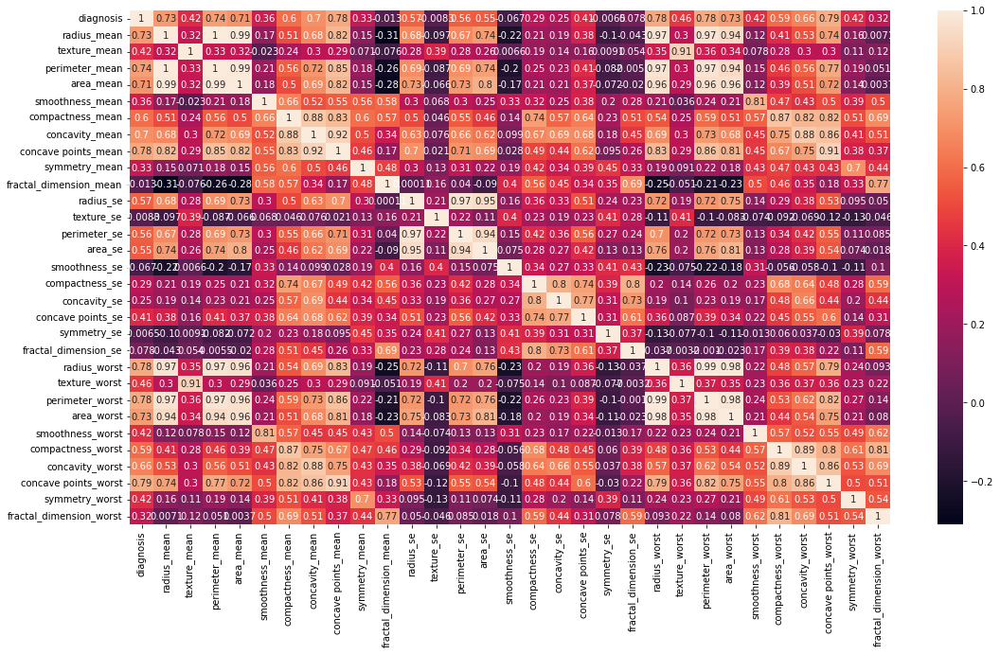

In [6]:
sns.heatmap(breast.corr(), annot = True);

To experiment with model success, initially only the data with more than 0.65 absolute correlation was fed. Later on by comparison, it is concluded that this approach did not improve the prediction capabilities of the model.

In [7]:
corr = list(breast.corr()[(breast.corr()["diagnosis"] > 0.65) | (breast.corr()["diagnosis"] < -0.65)].index.values)
corr
#breast = breast[corr]

['diagnosis',
 'radius_mean',
 'perimeter_mean',
 'area_mean',
 'concavity_mean',
 'concave points_mean',
 'radius_worst',
 'perimeter_worst',
 'area_worst',
 'concavity_worst',
 'concave points_worst']

### 2.2 Decision Tree Application

The first of the following functions splits the data into train and test sets with replicable randomness. treeEvaluator function demonstrates minimum accepted leaf size parameters effect on the model accuracy under different criterias.

In [8]:
def trainTestSplit(
    df,
    train_test_split
):
    #test-train split keys
    random.seed(10)
    train_index = pd.DataFrame( [True]*df.shape[0] )
    randomlist = random.sample(range(0, df.shape[0]), int(np.floor(df.shape[0]*(1-train_test_split))) )
    train_index.iloc[ randomlist ] = False
    train_index = list(train_index[0].values)
    
    #test-train split
    train_df = df.iloc[ train_index,: ].copy()
    test_df = df.iloc[ list(~np.array(train_index)),: ].copy()
    print("Train data size: ",train_df.shape[0] )
    print("Test data size: ",test_df.shape[0] )

    #dimension check
    if df.shape[0] != ( train_df.shape[0] + test_df.shape[0] ):
        exit("Input dimensions do-not match!")
        
    return train_df, test_df

def treeEvaluator(
    df,
    target_key,
    train_test_split=0.8,
    max_acceptable_leaf_size=20
):
    start = time.time()
    
    training_features = list(df.columns.values)
    training_features.remove(target_key)
    
    train_df, test_df = trainTestSplit( df, train_test_split )
    
    train_accuracy_gini = []
    test_accuracy_gini = []
    train_accuracy_entropy = []
    test_accuracy_entropy = []
    for i in range( 1, max_acceptable_leaf_size+1 ):

        #train model
        model_gini = DecisionTreeClassifier(criterion="gini", min_samples_leaf = i)
        model_gini.fit(
            train_df[ training_features ].values,
            train_df[ target_key ].values
        )
        model_entropy = DecisionTreeClassifier(criterion="entropy", min_samples_leaf = i)
        model_entropy.fit(
            train_df[ training_features ].values,
            train_df[ target_key ].values
        )

        #predictions
        train_prediction_gini = model_gini.predict( train_df[ training_features ].values )
        test_prediction_gini = model_gini.predict( test_df[ training_features ].values )
        train_prediction_entropy = model_entropy.predict( train_df[ training_features ].values )
        test_prediction_entropy = model_entropy.predict( test_df[ training_features ].values )
    
        #accuracy
        train_accuracy_gini.append( metrics.accuracy_score(train_df[ target_key ].values, train_prediction_gini) )
        test_accuracy_gini.append( metrics.accuracy_score(test_df[ target_key ].values, test_prediction_gini) )
        train_accuracy_entropy.append( metrics.accuracy_score(train_df[ target_key ].values, train_prediction_entropy) )
        test_accuracy_entropy.append( metrics.accuracy_score(test_df[ target_key ].values, test_prediction_entropy) )
    
    print( "Elapsed time :",round(time.time()-start,2), "seconds." )
    
    #plots
    xticks = np.linspace( 1,max_acceptable_leaf_size,max_acceptable_leaf_size )
    plt.plot(
        xticks,
        train_accuracy_gini,
        label="Gini Train Accuracy",
    )
    plt.plot(
        xticks,
        test_accuracy_gini,
        label="Gini Test Accuracy"
    )
    plt.plot(
        xticks,
        train_accuracy_entropy,
        label="Entropy Train Accuracy"
    )
    plt.plot(
        xticks,
        test_accuracy_entropy,
        label="Entropy Test Accuracy"
    )
    plt.xticks( xticks )
    plt.legend( loc=4, fontsize="xx-large" )
    plt.title("Model Accuracy Comparison", fontsize=25)
    plt.xlabel( "Minimum Number of Data in Leaf", fontsize=18 )
    plt.ylabel( "Accuracy", fontsize=18 )
    plt.show()

Train-test split ratio is intentionally kept low in order to remain with a siginificant test set size. For this data set, application with "Gini" criteria yield better results compared to entropy.

Train data size:  370
Test data size:  199
Elapsed time : 0.25 seconds.


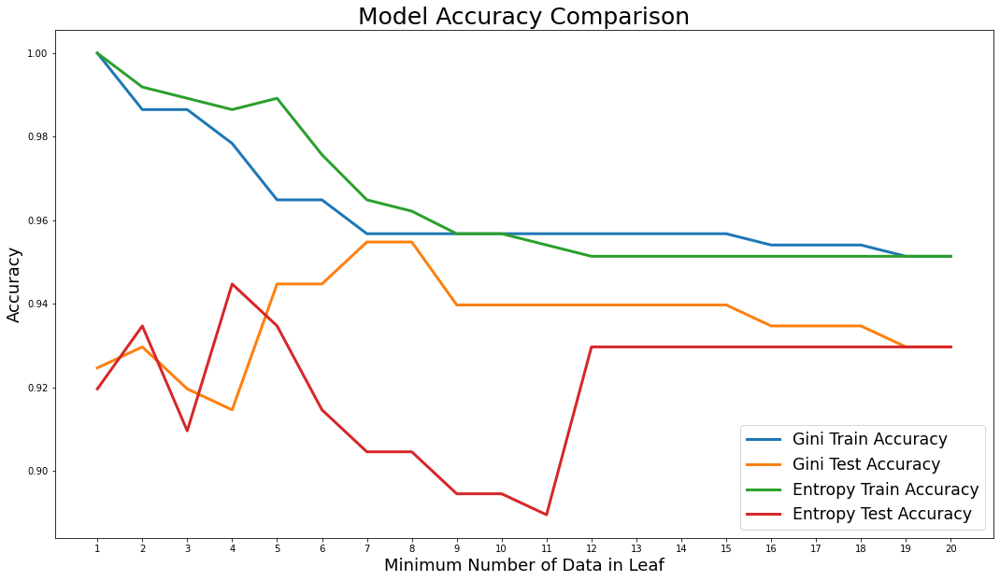

In [9]:
treeEvaluator( breast,
             "diagnosis",
             0.65)

Regarding the chart above, the best accuracy is achieved by allowing minimum of seven data points per leaf with gini criterion. Surprisingly, accuracies on training and test sets are almost the same, defying over-fitting.

In [10]:
train_df, test_df = trainTestSplit( breast, 0.65 )

#best configuration
tumorTree = DecisionTreeClassifier(criterion="gini", min_samples_leaf = 7)
tumorTree.fit(
    train_df[list(test_df.columns.values[1::])].values,
    train_df[["diagnosis"]].values
)

#prediction
train_prediction = tumorTree.predict( train_df[list(test_df.columns.values[1::])].values )
test_prediction = tumorTree.predict( test_df[list(test_df.columns.values[1::])].values )

#accuracy
print( "Training data accuracy: %" \
      + str(round(metrics.accuracy_score(train_df[["diagnosis"]].values, train_prediction)*100,2)) )
print( "Test data accuracy: %" \
      + str(round(metrics.accuracy_score(test_df[["diagnosis"]].values, test_prediction)*100,2)) )

Train data size:  370
Test data size:  199
Training data accuracy: %95.68
Test data accuracy: %95.48


Following figure shows the feature level selection of the model during branching. Most of the leaves express low gini values, making this model acceptably succesful

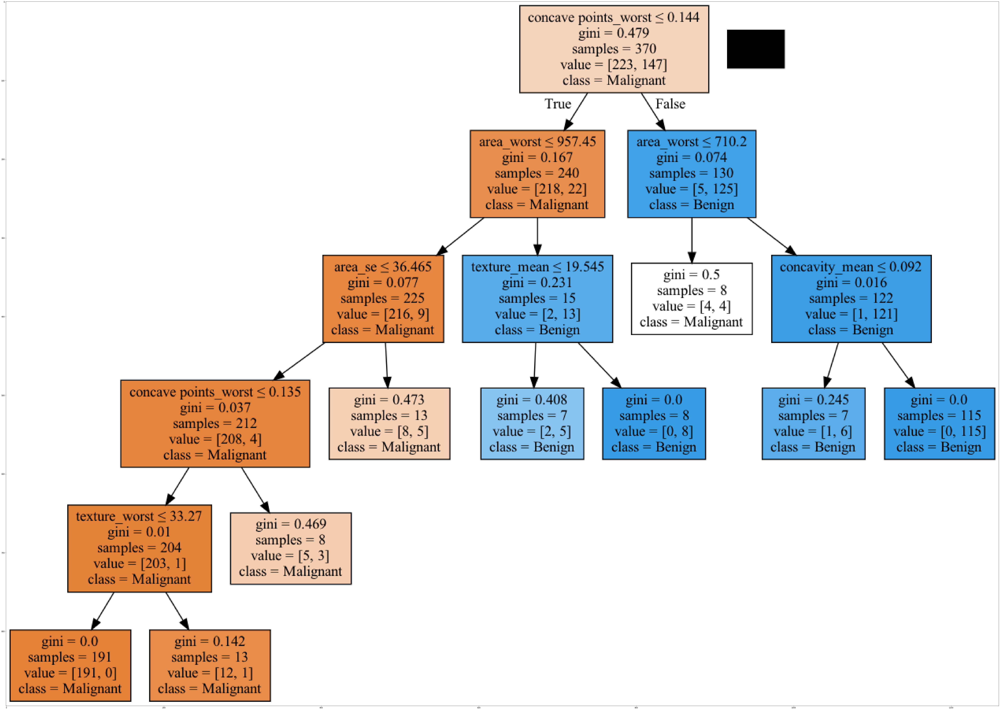

In [11]:
dot_data = StringIO()
filename = "tumorTree.png"
featureNames = breast.columns.values[1::]
targetNames = ["Malignant", "Benign"]
out=tree.export_graphviz(tumorTree,
                         feature_names=featureNames,
                         out_file=dot_data,
                         class_names= targetNames,
                         filled=True,
                         special_characters=True,
                         rotate=False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')

Since both of the leaves at the maximum depth are of same diagnosis, the model can be simplified by cutting the branches at a previous depth level, without loss of accuracy.

In [12]:
tumorTree = DecisionTreeClassifier(criterion="gini", max_depth = 3, min_samples_leaf = 7 )
tumorTree.fit(
    train_df[list(test_df.columns.values[1::])].values,
    train_df[["diagnosis"]].values
)

#prediction
train_prediction = tumorTree.predict( train_df[list(test_df.columns.values[1::])].values )
test_prediction = tumorTree.predict( test_df[list(test_df.columns.values[1::])].values )

#accuracy
print( "Training data accuracy: %" \
      + str(round(metrics.accuracy_score(train_df[["diagnosis"]].values, train_prediction)*100,2)) )
print( "Test data accuracy: %" \
      + str(round(metrics.accuracy_score(test_df[["diagnosis"]].values, test_prediction)*100,2)) )

Training data accuracy: %95.68
Test data accuracy: %95.48


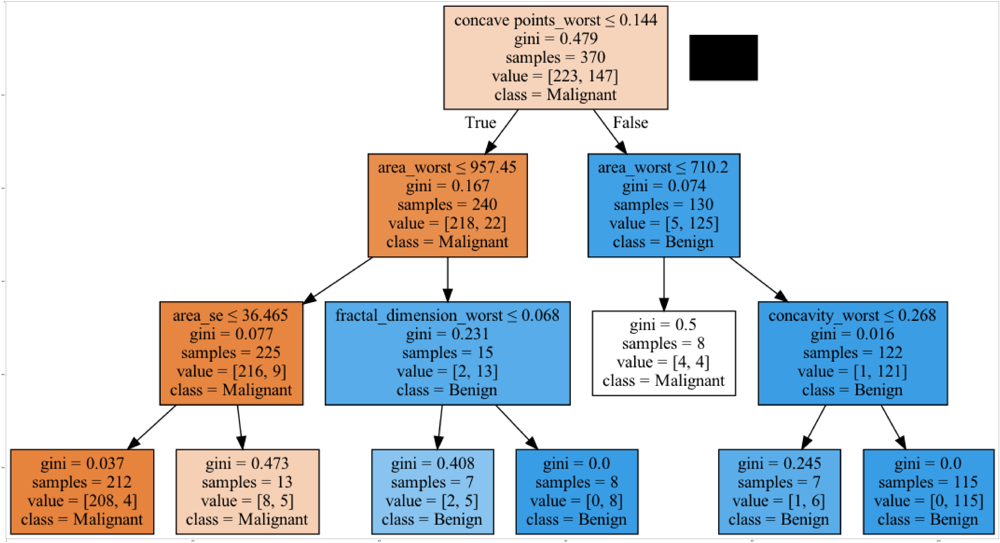

In [13]:
dot_data = StringIO()
filename = "tumorTree.png"
featureNames = breast.columns.values[1::]
targetNames = ["Malignant", "Benign"]
out=tree.export_graphviz(tumorTree,
                         feature_names=featureNames,
                         out_file=dot_data,
                         class_names= targetNames,
                         filled=True,
                         special_characters=True,
                         rotate=False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')

### 2.3 Random Forest Application

Similarly to desicion tree classifier evaluation function, this function displays an accuracy comparison graph for random forest models that are varying in terms of bootstrap size.

In [14]:
def forestEvaluator(
    df,
    target_key,
    train_test_split=0.8,
    max_features = 20

):
    start = time.time()
    
    training_features = list(df.columns.values)
    training_features.remove(target_key)
    
    train_df, test_df = trainTestSplit( df, train_test_split )
    
    train_accuracy_gini = []
    test_accuracy_gini = []
    train_accuracy_entropy = []
    test_accuracy_entropy = []
    for i in range( 1,max_features+1 ):
        
        #Models
        rf_gini = RandomForestClassifier(n_estimators = 500,
                                         criterion="gini",
                                         max_features = max_features)
        rf_gini.fit(train_df[training_features].values,
                train_df[target_key].values)
        rf_entropy = RandomForestClassifier(n_estimators = 500,
                                            criterion="entropy",
                                            max_features = max_features)
        rf_entropy.fit(train_df[training_features].values,
                train_df[target_key].values)
        
        #predictions
        train_prediction_gini = np.round(rf_gini.predict( train_df[training_features].values ))
        test_prediction_gini = np.round(rf_gini.predict( test_df[training_features].values ))
        train_prediction_entropy = np.round(rf_entropy.predict( train_df[training_features].values ))
        test_prediction_entropy = np.round(rf_entropy.predict( test_df[training_features].values ))
        
        #accuracy
        train_accuracy_gini.append( metrics.accuracy_score(train_df[target_key].values, train_prediction_gini) )
        test_accuracy_gini.append( metrics.accuracy_score(test_df[target_key].values, test_prediction_gini) )
        train_accuracy_entropy.append( metrics.accuracy_score(train_df[target_key].values, train_prediction_entropy) )
        test_accuracy_entropy.append( metrics.accuracy_score(test_df[target_key].values, test_prediction_entropy) )
    
    print( "Elapsed time :",round(time.time()-start,2), "seconds." )
    
    #plot
    xticks = np.linspace( 1, max_features, max_features )
    plt.xticks( xticks )
    plt.plot(xticks,
            train_accuracy_gini,
            label="Gini Train Accuracy")
    plt.plot(xticks,
            test_accuracy_gini,
            label="Gini Test Accuracy")
    plt.plot(xticks,
            train_accuracy_entropy,
            label="Entropy Train Accuracy")
    plt.plot(xticks,
            test_accuracy_entropy,
            label="Entropy Test Accuracy")
    plt.legend( loc=4 )
    plt.xlabel("Bootstrap Size", fontsize=18)
    plt.ylabel("Accuracy", fontsize=18)
    plt.title("Model Accuracy Comparison", fontsize=25)
    plt.show()

Entropy criterion yielded the best accuracy, out performing the single decision tree model.

Train data size:  370
Test data size:  199
Elapsed time : 55.23 seconds.


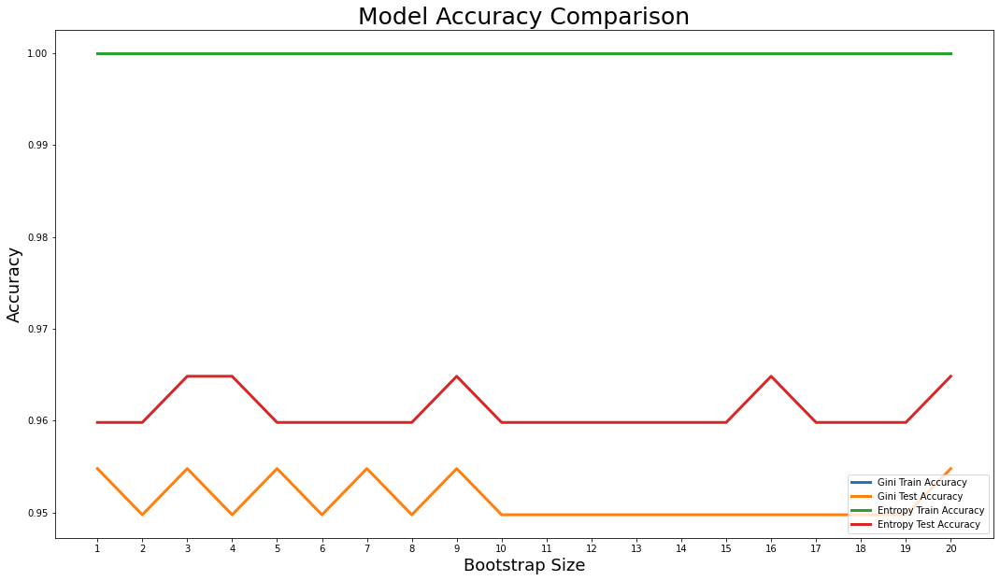

In [15]:
forestEvaluator(breast,
               "diagnosis",
               0.65)

In [16]:
train_df, test_df = trainTestSplit( breast, 0.65 )

rf = RandomForestClassifier(n_estimators = 500,
                            criterion = "entropy",
                            max_features = 15)
rf.fit(train_df[training_features].values,
             train_df[target_key].values)

train_prediction = np.round(rf.predict( train_df[training_features].values ))
test_prediction = np.round(rf.predict( test_df[training_features].values ))

print( "Training data accuracy: %" \
      + str(round( metrics.accuracy_score(train_prediction, train_df[target_key].values )*100, 2) ))
print( "Test data accuracy: %" \
      + str(round( metrics.accuracy_score(test_prediction, test_df[target_key].values )*100, 2) ))

Train data size:  370
Test data size:  199
Training data accuracy: %100.0
Test data accuracy: %95.98


The model was able to create some leaves with zero entropy, making perfect distinction among some cases.

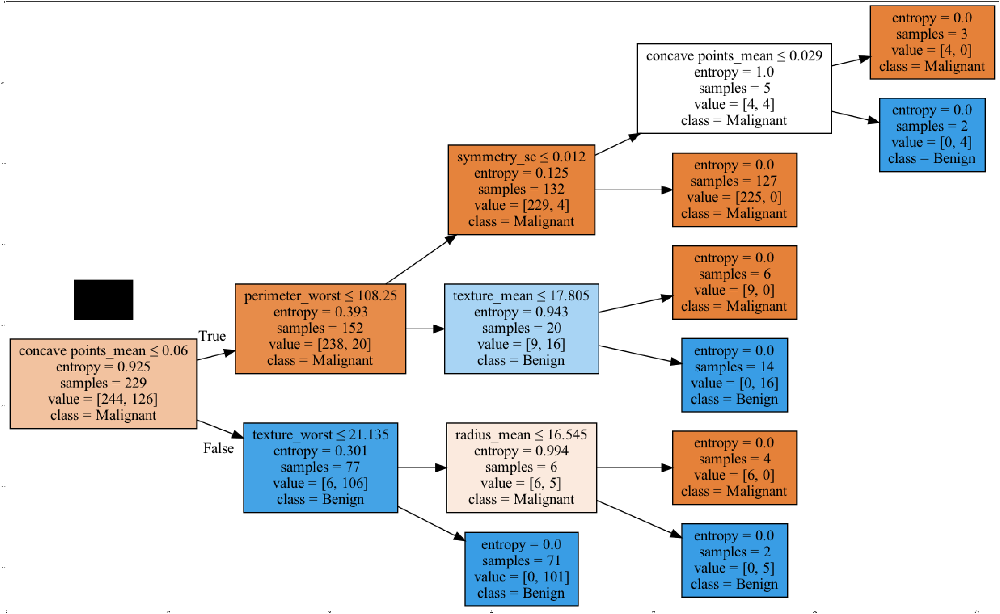

In [17]:
dot_data = StringIO()
filename = "tumorForest.png"
estimator = rf.estimators_[5]

out=tree.export_graphviz(estimator,
                         feature_names=featureNames,
                         out_file=dot_data,
                         class_names= targetNames,
                         filled=True,
                         special_characters=True,
                         rotate=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')



## 3. Fetus Health Analysis
Reduction of child mortality is a key indicator of human progress (Unicef, Child survival and the SDGs). It is possible to determine a child's up to a some degree by obtaining Cardiotocogram measurements. The following data set, provided by Ayres de Campos et al. (2000) SisPorto 2.0 A Program for Automated Analysis of Cardiotocograms. J Matern Fetal Med 5:311-318, consist of some measurements and expert diagnosis of fetus health condition. Details of the data set and meaning of the individual data fields can be obtained from https://www.kaggle.com/datasets/andrewmvd/fetal-health-classification

### 3.1 Data Preparation
The raw data itself is very clean, consisting of zero missing values with proper data types. The target variable is "Fetal Health" and the rest is the respective measurements.

In [18]:
fetal = pd.read_csv( os.path.realpath("")+"/fetal_health.csv" )
fetal.tail(5)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
2121,140.0,0.000,0.000,0.007,0.0,0.0,0.0,79.0,0.2,25.0,...,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0,2.0
2122,140.0,0.001,0.000,0.007,0.0,0.0,0.0,78.0,0.4,22.0,...,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2.0
2123,140.0,0.001,0.000,0.007,0.0,0.0,0.0,79.0,0.4,20.0,...,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2.0
2124,140.0,0.001,0.000,0.006,0.0,0.0,0.0,78.0,0.4,27.0,...,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2.0
2125,142.0,0.002,0.002,0.008,0.0,0.0,0.0,74.0,0.4,36.0,...,117.0,159.0,2.0,1.0,145.0,143.0,145.0,1.0,0.0,1.0


In [19]:
target_key = "fetal_health"
training_features = list(fetal.columns.values)
training_features.remove(target_key)
fetal.dtypes

baseline value                                            float64
accelerations                                             float64
fetal_movement                                            float64
uterine_contractions                                      float64
light_decelerations                                       float64
severe_decelerations                                      float64
prolongued_decelerations                                  float64
abnormal_short_term_variability                           float64
mean_value_of_short_term_variability                      float64
percentage_of_time_with_abnormal_long_term_variability    float64
mean_value_of_long_term_variability                       float64
histogram_width                                           float64
histogram_min                                             float64
histogram_max                                             float64
histogram_number_of_peaks                                 float64
histogram_

In [20]:
fetal.describe()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.00000,...,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.303857,0.003178,0.009481,0.004366,0.001889,0.000003,0.000159,46.990122,1.332785,9.84666,...,93.579492,164.025400,4.068203,0.323612,137.452023,134.610536,138.090310,18.808090,0.320320,1.304327
std,9.840844,0.003866,0.046666,0.002946,0.002960,0.000057,0.000590,17.192814,0.883241,18.39688,...,29.560212,17.944183,2.949386,0.706059,16.381289,15.593596,14.466589,28.977636,0.610829,0.614377
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.00000,...,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.00000,...,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.00000,...,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.00000,...,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.00000,...,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


Further provind the data do not have missing values.

In [21]:
sum(sum( np.isnan( fetal.values ) ))

0

### 3.2 Decision Tree Application
In contrast with expectations, training data accuracy decreases by the increase in minimum acceptable leaf content amount. Since the data amount is larger than section 2, test split ratio is decreased.

Train data size:  1701
Test data size:  425
Elapsed time : 0.48 seconds.


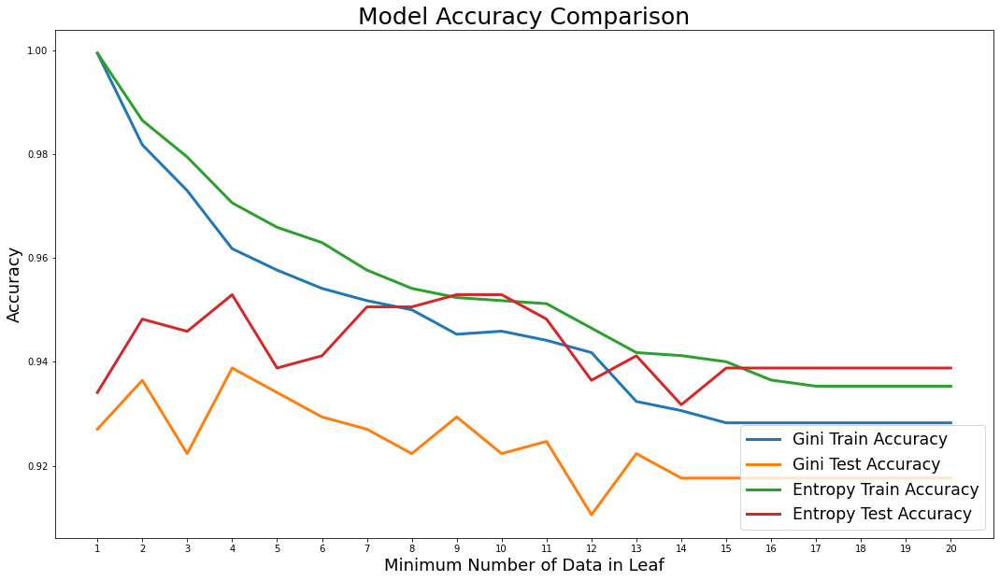

In [22]:
treeEvaluator( fetal,
             target_key,
             0.8)

The best test prediction accuracy is obtained with entropy method at minimum leaf size of ten. Surprisingly test accuracy is sligthly higher than training accuracy.

In [23]:
train_df, test_df = trainTestSplit( fetal, 0.8 )

fetalTree = DecisionTreeClassifier(criterion="entropy", min_samples_leaf = 10 )
fetalTree.fit(
    train_df[training_features].values,
    train_df[target_key].values
)

#prediction
train_prediction = fetalTree.predict( train_df[training_features].values )
test_prediction = fetalTree.predict( test_df[training_features].values )

#accuracy
print( "Training data accuracy: %" \
      + str(round(metrics.accuracy_score(train_df[target_key].values, train_prediction)*100,2)) )
print( "Test data accuracy: %" \
      + str(round(metrics.accuracy_score(test_df[target_key].values, test_prediction)*100,2)) )

Train data size:  1701
Test data size:  425
Training data accuracy: %95.18
Test data accuracy: %95.29


Although the accuracy performance of the model is fairly good, it is observed that some leafs high in entropy. Therefore, impurity in the last nodes imply that some aspects of this model can be better utilized by making modifications in the data or the model.

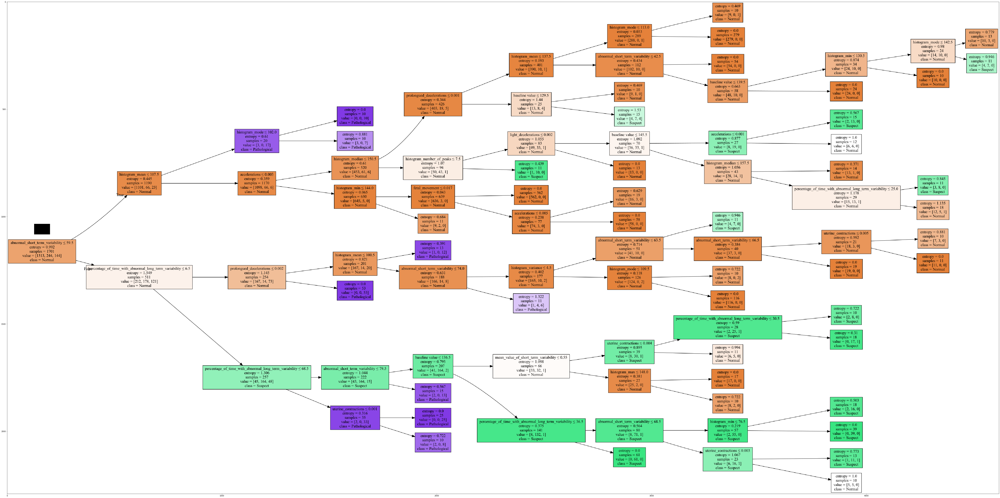

In [24]:
dot_data = StringIO()
filename = "fetalTree.png"
targetNames = ["Normal", "Suspect", "Pathological"]
out=tree.export_graphviz(fetalTree,
                         feature_names=training_features,
                         out_file=dot_data,
                         class_names= targetNames,
                         filled=True,
                         special_characters=True,
                         rotate=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')

### 3.3 Random Forest Application
Result of random forest application with different bootstrap sizes are presented below. Surprisingly, both criterions were able to achieve a perfect fit for training sets.

Train data size:  1701
Test data size:  425
Elapsed time : 148.14 seconds.


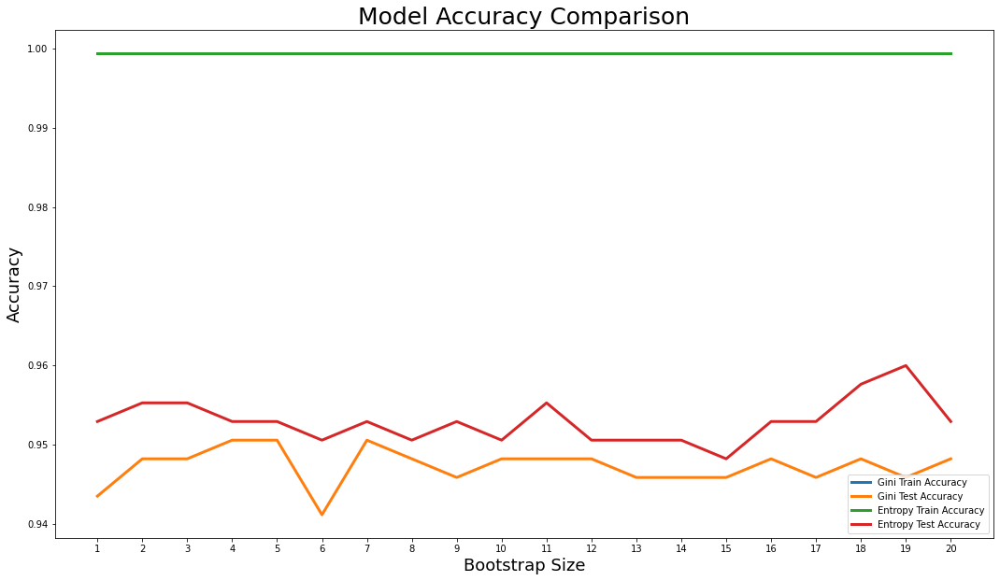

In [25]:
forestEvaluator(fetal,
               target_key)

Utilizing random forest application increased the test prediction accuracy insignificantly. However, the training data accuracy is close to perfect. Since the training data surely has a sort of noise, this is a sign of over-fitting.

In [26]:
train_df, test_df = trainTestSplit( fetal, 0.65 )

rf = RandomForestClassifier(n_estimators = 500,
                            criterion = "entropy",
                            max_features = 9)
rf.fit(train_df[training_features].values,
             train_df[target_key].values)

train_prediction = np.round(rf.predict( train_df[training_features].values ))
test_prediction = np.round(rf.predict( test_df[training_features].values ))

print( "Training data accuracy: %" \
      + str(round( metrics.accuracy_score(train_prediction, train_df[target_key].values )*100, 2) ))
print( "Test data accuracy: %" \
      + str(round( metrics.accuracy_score(test_prediction, test_df[target_key].values )*100, 2) ))

Train data size:  1382
Test data size:  744
Training data accuracy: %99.93
Test data accuracy: %95.56


By observing the tree branches, some leaf nodes were able to capture purity. This purity improvement implies that the random forest application is superior for this case when compared to a single decision tree application. Although the accuracy did not improve significantly, the other error measurements, out of scope for this analysis, most probably should have been improved.

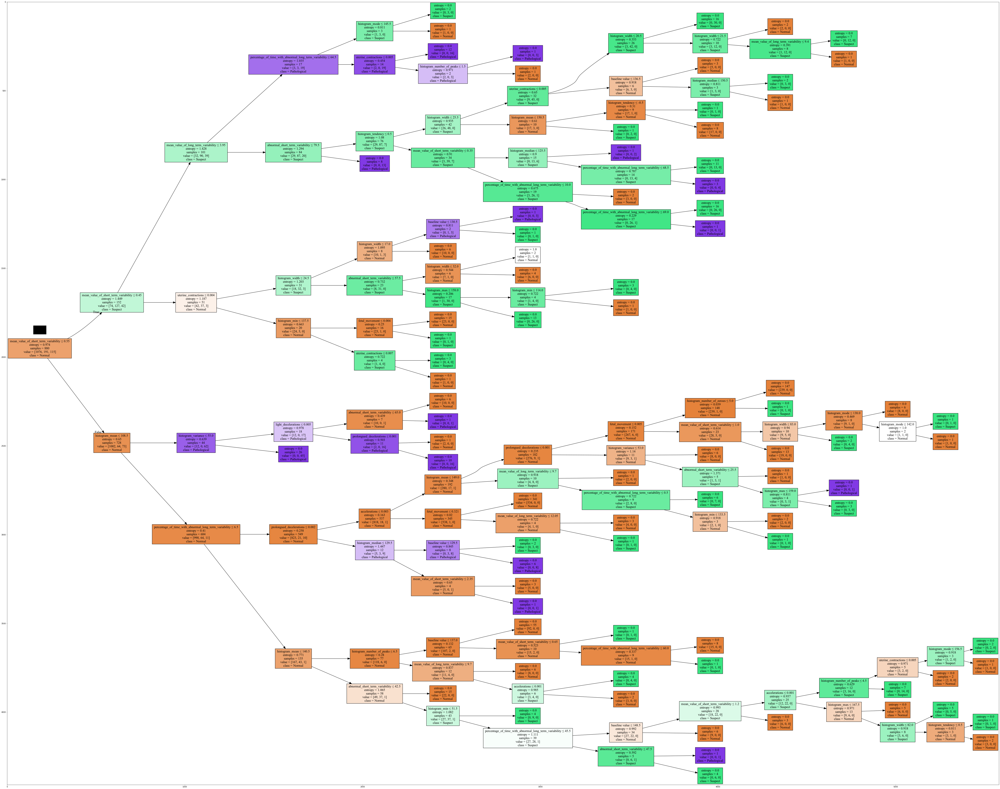

In [27]:
dot_data = StringIO()
filename = "fetalforest.png"
estimator = rf.estimators_[5]

out=tree.export_graphviz(estimator,
                         feature_names=training_features,
                         out_file=dot_data,
                         class_names= targetNames,
                         filled=True,
                         special_characters=True,
                         rotate=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')



## 4. Heart Condition Mortality Analysis
Heart failures are among the most critical challenges that the medicine is facing currently. The following data set by E.M. Mirkes, School of Mathematics and Actuarial science, University of Leicester provides some measurements regarding patients heart conditions at the hospital visit and last twelve columns of the data set represents diagnosis of the patient.
### 4.1 Data Preparation

In [28]:
mi = pd.read_csv( os.path.realpath("")+"/MI.csv" )
print(mi.shape)
mi.dtypes

(1700, 124)


ID             int64
AGE          float64
SEX            int64
INF_ANAM     float64
STENOK_AN    float64
              ...   
DRESSLER       int64
ZSN            int64
REC_IM         int64
P_IM_STEN      int64
LET_IS         int64
Length: 124, dtype: object

Count of the individual data fields vary, this implies missing points in the data.

In [29]:
mi.describe()

,ID,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
count,1700.000000,1692.000000,1700.000000,1696.000000,1594.000000,1627.000000,1649.000000,72.00000,1691.000000,1692.000000,...,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000
mean,850.500000,61.856974,0.626471,0.554835,2.316186,1.205286,1.160703,0.37500,1.393258,0.033688,...,0.024706,0.041765,0.033529,0.093529,0.031765,0.044118,0.231765,0.093529,0.087059,0.477059
std,490.892045,11.259936,0.483883,0.836801,2.440586,1.040814,0.801400,0.48752,1.088803,0.180478,...,0.155273,0.200110,0.180067,0.291259,0.175425,0.205417,0.422084,0.291259,0.282004,1.381818
min,1.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,425.750000,54.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,850.500000,63.000000,1.000000,0.000000,1.000000,2.000000,1.000000,0.00000,2.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1275.250000,70.000000,1.000000,1.000000,5.000000,2.000000,2.000000,1.00000,2.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1700.000000,92.000000,1.000000,3.000000,6.000000,4.000000,2.000000,1.00000,3.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


Only target variable for this analysis will be patient mortality, disregarding the cause. Therefore, irrelevant target variables are eliminated and the relevant target variable is binned.

In [30]:
death = np.zeros(mi.shape[0])
death[ mi["LET_IS"] > 0 ] = 1

raw_target_keys = mi.columns.values[111:]
mi.drop( ["ID"] + list(raw_target_keys), axis=1, inplace=True )

target_key = "DEATH"
mi[target_key] = death
mi.head()

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,DLIT_AG,...,NOT_NA_1_n,NOT_NA_2_n,NOT_NA_3_n,LID_S_n,B_BLOK_S_n,ANT_CA_S_n,GEPAR_S_n,ASP_S_n,TIKL_S_n,DEATH
0,77.0,1,2.0,1.0,1.0,2.0,NaN,3.0,0.0,7.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
1,55.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0
2,52.0,1,0.0,0.0,0.0,2.0,NaN,2.0,0.0,2.0,...,3.0,2.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0
3,68.0,0,0.0,0.0,0.0,2.0,NaN,2.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
4,60.0,1,0.0,0.0,0.0,2.0,NaN,3.0,0.0,7.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


The defined function tells most of the columns and all of the rows contain missing values.

In [31]:
def nan_detector( df, print_opt=1 ):
    cols = [False]*df.shape[1]
    rows = pd.DataFrame( [False]*df.shape[0] )
    for col in range( 1,len(cols) ):

        #Nan in columns
        if sum(np.isnan( df.iloc[:,col] )) >0:
            cols[ col ] = True

        #Nan in rows
        rows.iloc[
            pd.DataFrame( np.isnan( df.iloc[:,col] ) )[
            pd.DataFrame( np.isnan( df.iloc[:,col] ) ).values
            ].index.values,:
        ] = True
    rows = list( rows.iloc[:,0].values )
    if print_opt == 1:
        print( "%"+str(round( 100*sum(cols) / df.shape[1], 2)), "of columns contain at least one Nan value."  )
        print( "%"+str(round( 100*sum(rows) / df.shape[0], 2)), "of rows contain at least one Nan value."  )
    
    return( round( sum(cols) / df.shape[1], 2), round( sum(rows) / df.shape[0], 2) )

nan_detector( mi )

%97.3 of columns contain at least one Nan value.
%100.0 of rows contain at least one Nan value.


(0.97, 1.0)

By plotting number of missing values per column, it is possible to see that some columns contain extraordinary amount of missing values. Therefore, artifically filling them may mislead the analysis. By visual observation, deleting columns with more than a hundred missing value should be able to ease the situation.

Number of columns with missing values above the criteria:  52


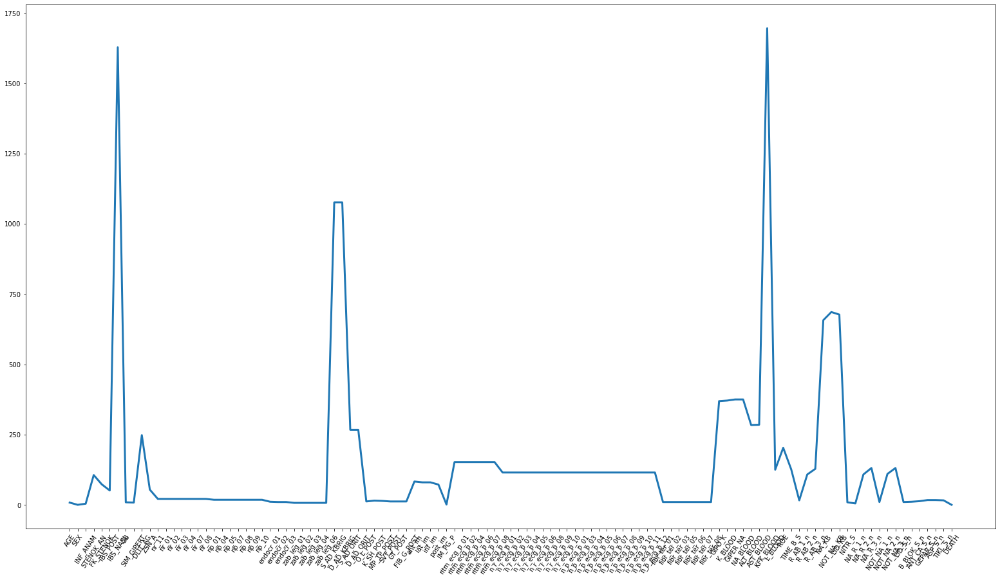

In [32]:
nan_per_col = []
for i in range( 0,mi.shape[1] ):
    nan_per_col.append( sum(np.isnan(mi.iloc[:,i])) )

print("Number of columns with missing values above the criteria: ", sum( np.array(nan_per_col)>100 ))    

plt.figure( figsize=(27,15) )
xticks = np.linspace( 0,mi.shape[1],mi.shape[1] )
plt.xticks( xticks, mi.columns.values, rotation=55 )
plt.plot(xticks, nan_per_col)
plt.show()

Still most of the columns do contain missing values but the number of rows with missing values decreased significantly. Eliminating such rows will probably eliminate most of the missing values.

%94.92 of columns contain at least one Nan value.
%15.12 of rows contain at least one Nan value.


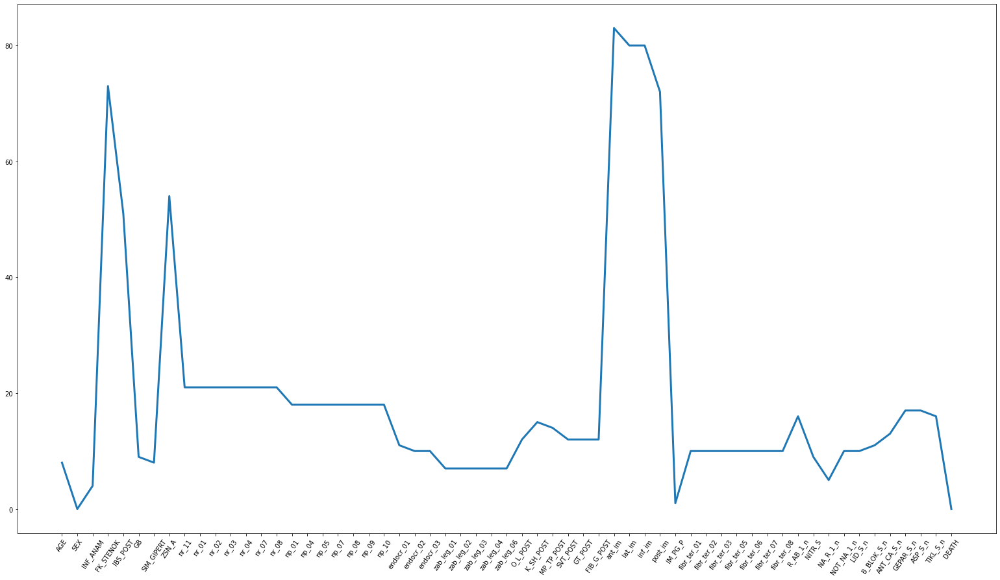

In [33]:
mi = mi[mi.columns.values[ np.array(nan_per_col)<100 ]]
nan_detector(mi)

nan_per_col = []
for i in range( 0,mi.shape[1] ):
    nan_per_col.append( sum(np.isnan(mi.iloc[:,i])) )
   
plt.figure( figsize=(27,15) )
xticks = np.linspace( 0,mi.shape[1],mi.shape[1] )
plt.xticks( xticks, mi.columns.values, rotation=55 )
plt.plot(xticks, nan_per_col)
plt.show()

With some reduction in the data set, the data do not contain missing values anymore and the data is not artificially altered.

In [34]:
nan_per_row = []
for i in range( 0,mi.shape[0] ):
    nan_per_row.append( sum(np.isnan(mi.iloc[i,:])) )
    
    
mi.drop( mi.index.values[np.array(nan_per_row) > 0],
        axis=0,
        inplace=True)

print("Data shape:", mi.shape)
mi.reset_index( drop=True, inplace=True )
nan_detector(mi)

training_features = list(mi.columns.values)
training_features.remove( target_key )

Data shape: (1436, 59)
%0.0 of columns contain at least one Nan value.
%0.0 of rows contain at least one Nan value.


### 4.2 Decision Tree Application
Although gini dominated the entropy configuration most of the runs, the best accuracy is obtained by entropy criterion.

Train data size:  1149
Test data size:  287
Elapsed time : 0.25 seconds.


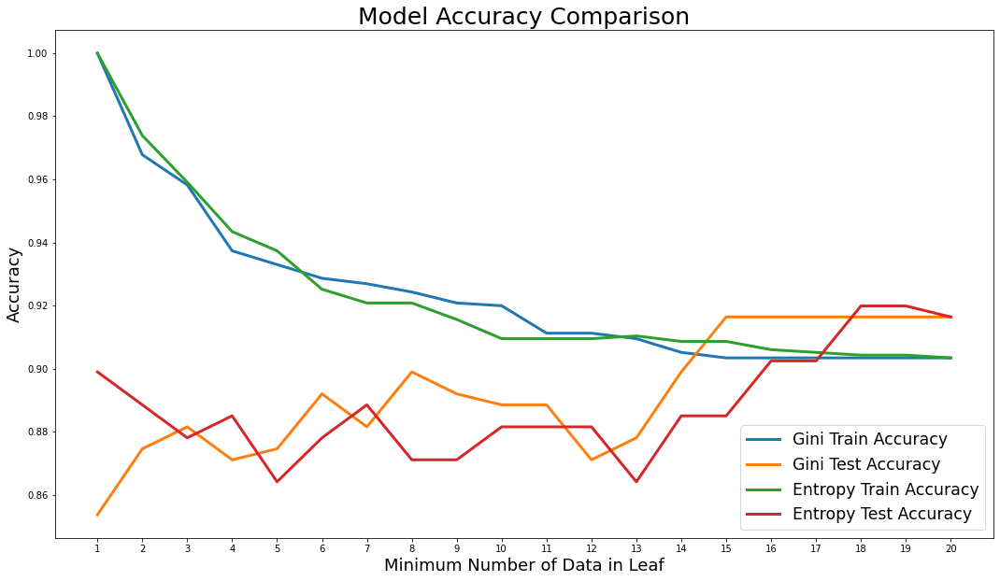

In [35]:
treeEvaluator(
    mi,
    target_key,
    0.8
)

Surprisingly the accuracy on the test data set is superior compared to the training data set accuracy.

In [36]:
train_df, test_df = trainTestSplit( mi, 0.8 )

miTree = DecisionTreeClassifier(criterion="entropy", min_samples_leaf = 18 )
miTree.fit(
    train_df[list(mi.columns.values[:-1])].values,
    train_df[target_key].values
)

#prediction
train_prediction = miTree.predict( train_df[list(test_df.columns.values[1::])].values )
test_prediction = miTree.predict( test_df[list(test_df.columns.values[1::])].values )

#accuracy
print( "Training data accuracy: %" \
      + str(round(metrics.accuracy_score(train_df[target_key].values, train_prediction)*100,2)) )
print( "Test data accuracy: %" \
      + str(round(metrics.accuracy_score(test_df[target_key].values, test_prediction)*100,2)) )

Train data size:  1149
Test data size:  287
Training data accuracy: %89.47
Test data accuracy: %91.64


Considerably low entropy values are obtained by the desicion tree.

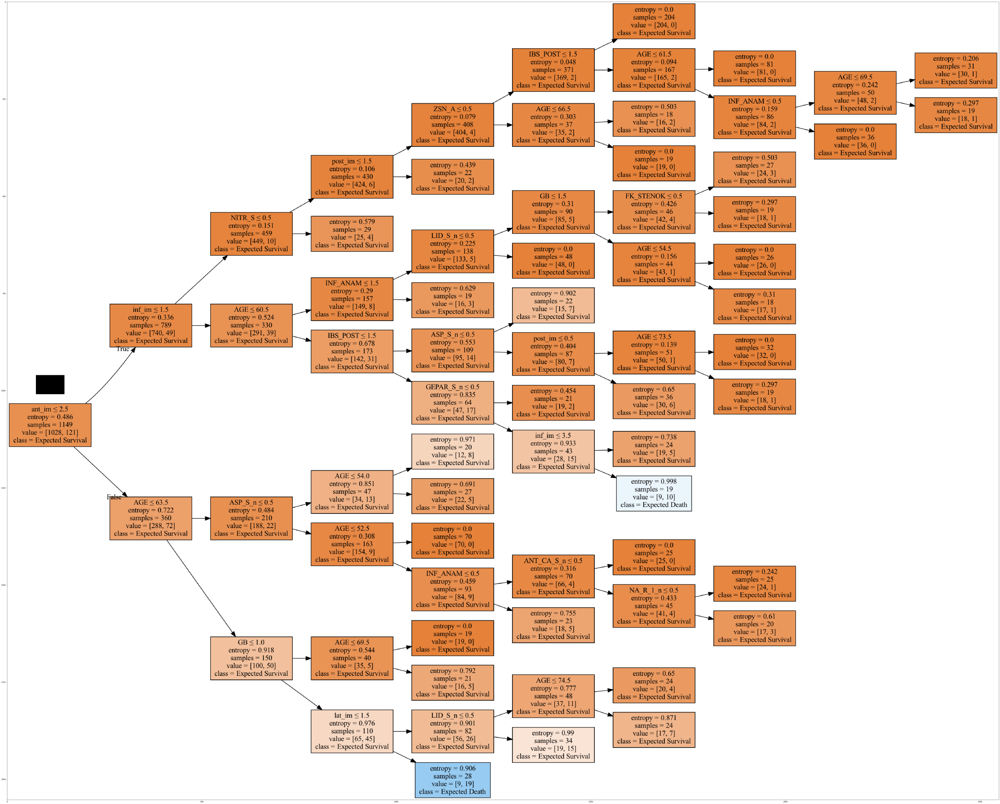

In [37]:
dot_data = StringIO()
filename = "miTree.png"
featureNames = mi.columns.values[:-1]
targetNames = ["Expected Survival", "Expected Death"]
out=tree.export_graphviz(miTree,
                         feature_names=featureNames,
                         out_file=dot_data,
                         class_names= targetNames,
                         filled=True,
                         special_characters=True,
                         rotate=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')

### 4.3 Random Forest Application
Random forest application increased the model accuracy. Achievement of perfection in training data set implies some sort of over-fitting.

Train data size:  1149
Test data size:  287
Elapsed time : 45.81 seconds.


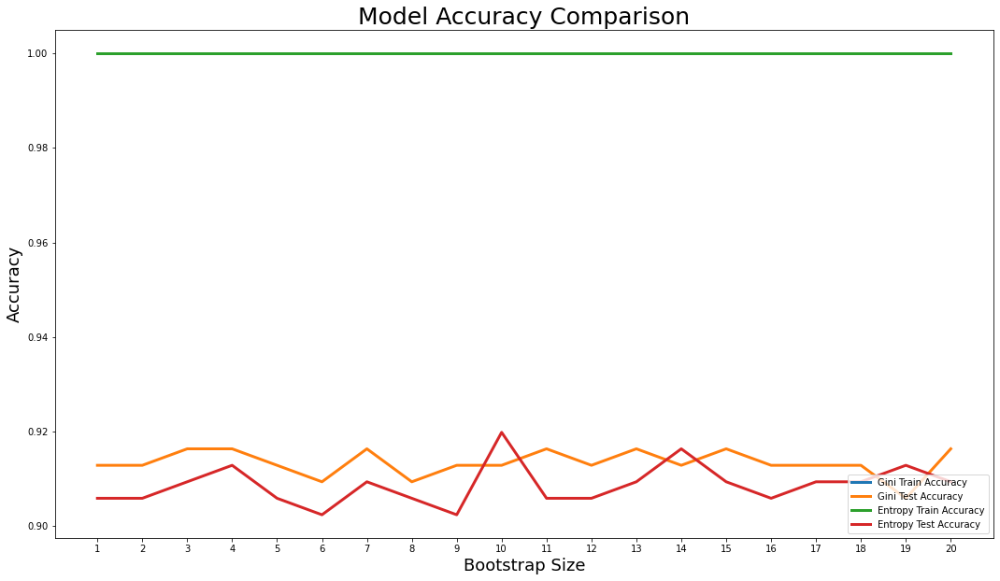

In [38]:
forestEvaluator(mi, "DEATH")

In [39]:
train_df, test_df = trainTestSplit( mi, 0.8 )

rf = RandomForestClassifier(n_estimators = 500,
                              max_features = 18,
                          criterion="gini")
rf.fit(train_df[training_features].values,
             train_df[target_key].values)

train_prediction = np.round(rf.predict( train_df[training_features].values ))
test_prediction = np.round(rf.predict( test_df[training_features].values ))

print( "Training data accuracy: %" \
      + str(round( metrics.accuracy_score(train_prediction, train_df[target_key].values )*100, 2) ))
print( "Test data accuracy: %" \
      + str(round( metrics.accuracy_score(test_prediction, test_df[target_key].values )*100, 2) ))

Train data size:  1149
Test data size:  287
Training data accuracy: %100.0
Test data accuracy: %91.64


By minor improvement in accuracy metrics and significant decreases in leaf entropy, random forest application for this case is significantly superior.

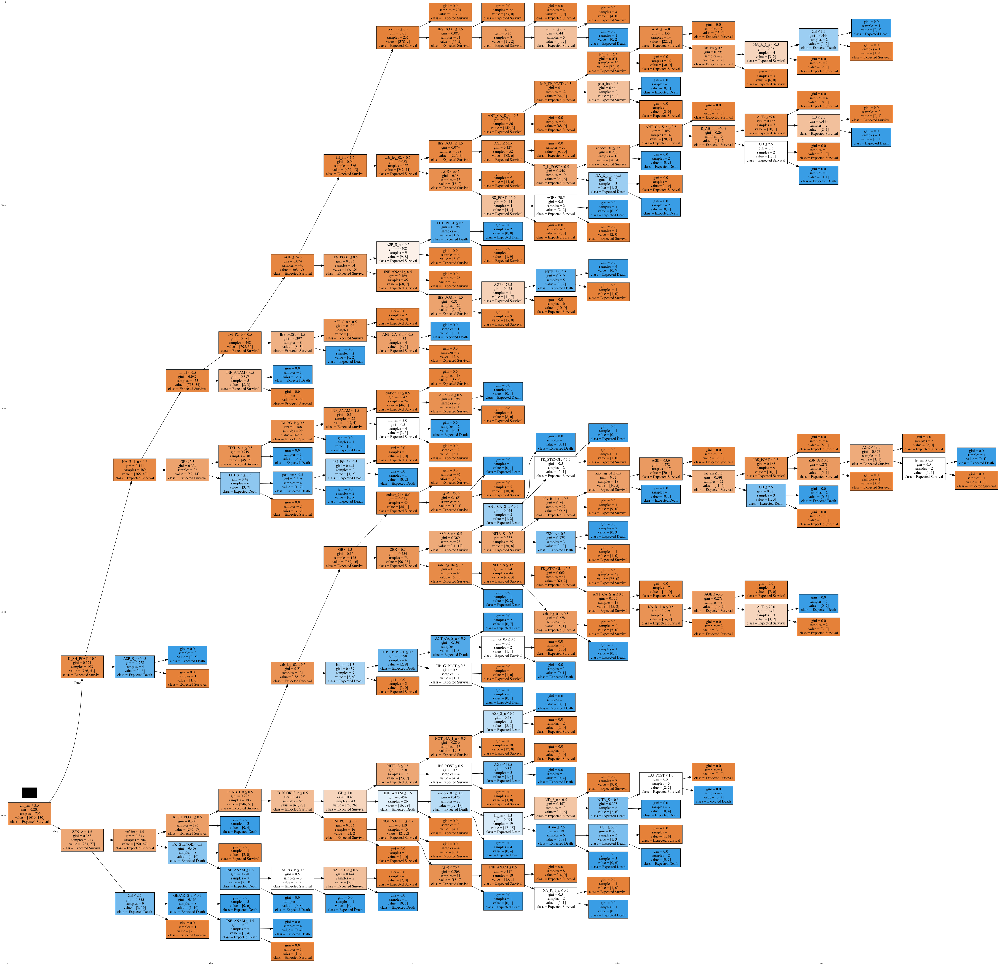

In [40]:
dot_data = StringIO()
filename = "miTree.png"
featureNames = mi.columns.values[:-1]
targetNames = ["Expected Survival", "Expected Death"]
estimator = rf.estimators_[5]

out=tree.export_graphviz(estimator,
                         feature_names=featureNames,
                         out_file=dot_data,
                         class_names= targetNames,
                         filled=True,
                         special_characters=True,
                         rotate=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')


## 5. Conclusion
There are significant differences entropy and gini criterion utilizations in both methods, but it is not possible to conclude ones mightiness because their capabilities in accuracy is is independently changing per application. Additionally, almost in all cases, a tree-based ensembly approach, random forest improved accuracy if not insignificantly changing but leaf-node entropy and gini metrics always improved very significantly in all cases. Therefore, possible improvement in one metric and certain improvement in purity imply superiority of the random forest application compared to utilization of single decision trees.